In [1]:
# default_exp cld_mst

In [2]:
# export cld_mst

import os
import json
import glob
import subprocess

import cv2
import numpy as np
from matplotlib import pyplot as plt
from shapely import geometry as geom

from math import floor

In [3]:
%load_ext line_profiler
%matplotlib inline

In [4]:
examples = glob.glob('examples/*.png')
examples

['examples/0162681551.png',
 'examples/0168366051.png',
 'examples/0168639352.png']

In [5]:
examples = [cv2.imread(path, cv2.IMREAD_GRAYSCALE) for path in examples]

In [6]:

import PIL.Image
import IPython.display

def show(arr):
    IPython.display.display(PIL.Image.fromarray(arr))

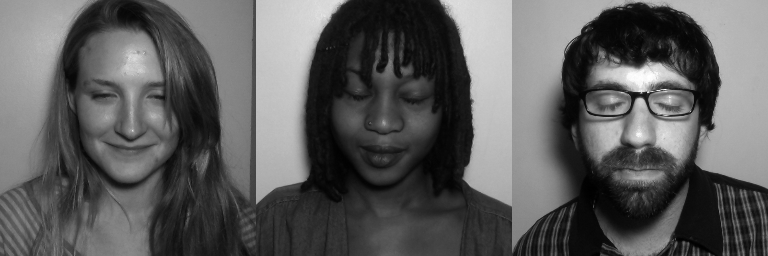

In [7]:
show(np.concatenate(examples, axis=1))

In [8]:
# export cld_mst
from blind_contour.edges import raster_edges

In [9]:
from ipywidgets import interact
gray = examples[0]

@interact(histogram_eq=False, cld=True, canny_low=(50, 150), canny_hi=(150, 250))
def _test(histogram_eq, cld, canny_low, canny_hi):
    edges = [raster_edges(ex, histogram_eq, cld, canny_low, canny_hi) for ex in examples]
    return show(np.concatenate(edges, axis=1))

interactive(children=(Checkbox(value=False, description='histogram_eq'), Checkbox(value=True, description='cld…

In [10]:
edges = raster_edges(gray)
edges[:, 240:] = 255
edges[:, :16] = 255
edges[:4, :] = 255
edges[252:, :] = 255
    
cv2.imwrite('trace_in.bmp', edges)
if os.name == 'nt':
    subprocess.check_call(r'.\potrace-1.16.win64\potrace.exe trace_in.bmp -o trace_out.geojson -b geojson')
else:
    subprocess.check_call(r'./potrace-1.16.linux-x86_64/potrace trace_in.bmp -o trace_out.geojson -b geojson', shell=True)

with open('trace_out.geojson') as fp:
    geojson = json.load(fp)


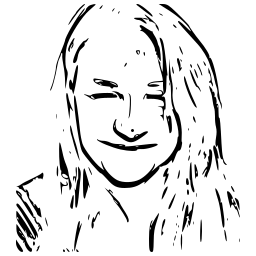

In [11]:
IPython.display.SVG('output.svg')

In [12]:
with open('output.geojson') as fp:
    geojson = json.load(fp)

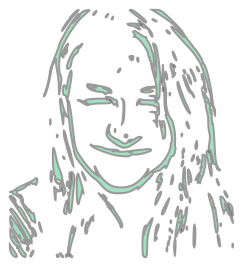

In [13]:
shapes = [geom.shape(feature["geometry"]) for feature in geojson['features']]
geom.GeometryCollection(shapes)

In [14]:
# export cld_mst

from centerline.geometry import Centerline 
from shapely import ops
import tqdm
def extract_centerlines(shapes):
    shapes = (shape.buffer(0) for shape in shapes)
    polys = [poly for poly in shapes if type(poly) == geom.Polygon and type(poly.envelope) == geom.Polygon]
    centerlines = [Centerline(p, valid=True) for p in polys]
    
    center_geoms = [line.geoms for line in centerlines]
    center_geom_lines = [geom.MultiLineString(line) for line in center_geoms]
    center_geom_lines = [ops.linemerge(line) for line in center_geom_lines]
    return center_geom_lines

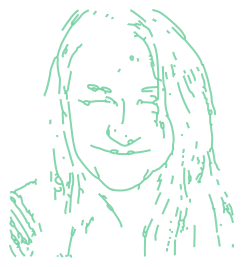

In [15]:

# profile: 
# %lprun -u 0.001 -f extract_centerlines geom.GeometryCollection(extract_centerlines(shapes))
center_geom_lines = extract_centerlines(shapes)
geom.GeometryCollection(center_geom_lines)

In [16]:
# export cld_mst

def explode_multilines(lines):
    out = []
    for line in lines:
        if type(line) == geom.multilinestring.MultiLineString:
            out.extend(subline for subline in line)
        else:
            out.append(line)
    return out

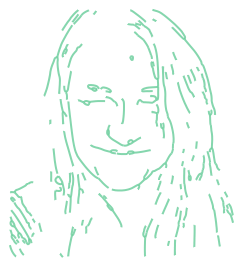

In [17]:


center_geom_lines = explode_multilines(center_geom_lines)

center_geom_lines = [line for line in center_geom_lines 
                     if max(line.length, geom.Point(line.coords[0]).distance(geom.Point(line.coords[-1]))) > 4]

geom.GeometryCollection(center_geom_lines)

In [18]:
# export cld_mst

def merge_naive(lines):
    all_coords = [list(line.coords) for line in lines]
    flattened = [coord for coords in all_coords for coord in coords]
    return geom.LineString(flattened)

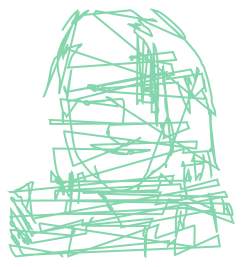

In [19]:
merge_naive(center_geom_lines)

In [20]:
# export cld_mst

from math import sqrt

def greedy_reorder(lines):
    ''' Reorder list of LineStrings greedily by lowest tail-tip distance'''
    lines = lines[:]
    curr = lines.pop(0)
    out = []
    while len(lines) > 0:
        start_curr = geom.Point(curr.coords[0])
        end_curr = geom.Point(curr.coords[-1])
        dist = float('+inf')
        nearest_tail = None
        for other in lines:
            start_o = geom.Point(other.coords[0])
            end_o = geom.Point(other.coords[-1])
            if end_curr.distance(start_o) < dist:
                dist = end_curr.distance(start_o)
                nearest_tail = other
            elif end_curr.distance(end_o) < dist:
                dist = end_curr.distance(end_o)
                other.coords = list(other.coords)[::-1]
                nearest_tail = other
        lines.remove(nearest_tail)
        out.append(nearest_tail)
        curr = nearest_tail
    return out

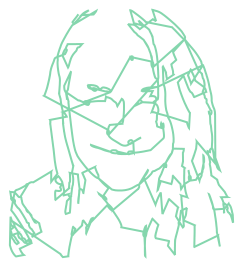

In [21]:
ordered_lines = greedy_reorder(center_geom_lines)
merge_naive(ordered_lines)

We can try ordering the lines by their distance to the center as the first paths in the list have more next-lines to chose from, and so hopefully the center of the face will get the best "picks".
We can also try ordering by start point closest to center or end point closest to center

In [22]:
# export cld_mst

def reorder_center_dist(lines):
    bounds = geom.MultiLineString(lines).bounds
    center = geom.Point((bounds[2] - bounds[0])/2, (bounds[3] - bounds[1])/2)
    def dist(line):
        return center.distance(line.centroid)
    return sorted(lines, key=dist)


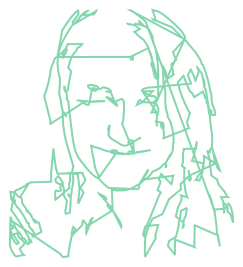

In [23]:

ordered_by_closest_to_center = reorder_center_dist(center_geom_lines)
ordered_lines = greedy_reorder(ordered_by_closest_to_center)
merge_naive(ordered_lines)

In [24]:
# export cld_mst

def reorder_start_dist(lines):
    bounds = geom.MultiLineString(lines).bounds
    center = geom.Point((bounds[2] - bounds[0])/2, (bounds[3] - bounds[1])/2)
    def dist(line):
        return center.distance(geom.Point(line.coords[0]))
    return sorted(lines, key=dist)


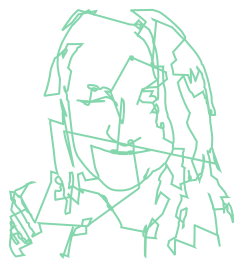

In [25]:

ordered_by_closest_to_center = reorder_start_dist(center_geom_lines)
ordered_lines = greedy_reorder(ordered_by_closest_to_center)
merge_naive(ordered_lines)

In [27]:
# export cld_mst

def reorder_end_dist(lines):
    bounds = geom.MultiLineString(lines).bounds
    center = geom.Point((bounds[2] - bounds[0])/2, (bounds[3] - bounds[1])/2)
    def dist(line):
        return center.distance(geom.Point(line.coords[-1]))
    return sorted(lines, key=dist)

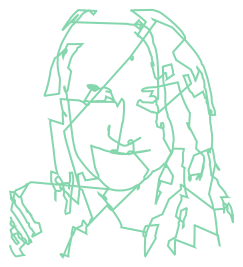

In [28]:
ordered_by_closest_to_center = reorder_end_dist(center_geom_lines)
ordered_lines = greedy_reorder(ordered_by_closest_to_center)
merge_naive(ordered_lines)

In [29]:
import scipy.sparse.csgraph as csgraph

In [30]:
1+1

2

In [31]:
np.arange(0, 5)

array([0, 1, 2, 3, 4])

In [32]:
# export cld_mst

def sobel(gray):
    scale = 1
    delta = 0
    ddepth = cv2.CV_32FC1

    grad_x = cv2.Sobel(gray, ddepth, 1, 0, ksize=3, scale=scale, delta=delta, borderType=cv2.BORDER_DEFAULT)
    # Gradient-Y
    # grad_y = cv.Scharr(gray,ddepth,0,1)
    grad_y = cv2.Sobel(gray, ddepth, 0, 1, ksize=3, scale=scale, delta=delta, borderType=cv2.BORDER_DEFAULT)
    
    
    abs_grad_x = cv2.convertScaleAbs(grad_x)
    abs_grad_y = cv2.convertScaleAbs(grad_y)
    
    
    grad = cv2.addWeighted(abs_grad_x, 0.5, abs_grad_y, 0.5, 0)
    return grad

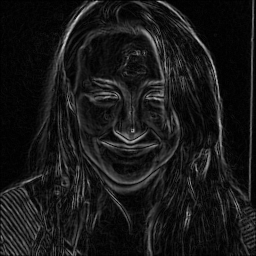

In [33]:
grad = sobel(gray)
show(grad)

In [34]:
grad_blurred = cv2.GaussianBlur(grad / grad.max(), (9, 9), 5.0)
grad_blurred /= grad_blurred.max()

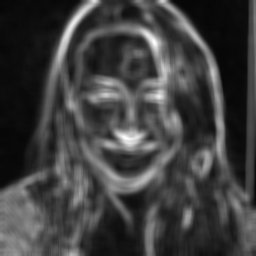

In [35]:
show((grad_blurred * 255).astype(np.uint8))

In [36]:
# export cld_mst

import numpy as np

def sample_grad(grad_blurred):
    gp = grad_blurred.copy()
    gp[gp < (gp.mean() + 0.5 * gp.std())] = 0.0
    prob = gp
    sample_at = (np.random.poisson(prob + 0.001, (256, 256)) > 0).astype(np.uint8)
    
    sampled_grad_pixels = grad_blurred * sample_at
    sampled_grad_pixels[0, 0] = 1
    sampled_grad_pixels[-1, -1] = 1
    sampled_grad_pixels[0, -1] = 1
    sampled_grad_pixels[-1, 0] = 1
    
    return sampled_grad_pixels


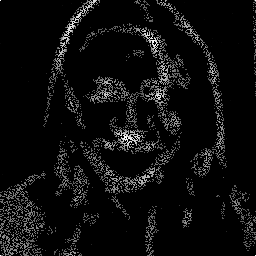

In [37]:
sampled_grad_pixels = sample_grad(grad_blurred)
show((sampled_grad_pixels * 255).astype(np.uint8))

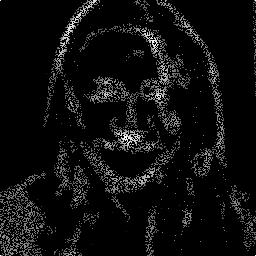

In [38]:
for line in center_geom_lines:
    s = line.coords[0]
    e = line.coords[-1]
    sampled_grad_pixels[255 - floor(s[1]), floor(s[0])] = 0.5
    sampled_grad_pixels[255 - floor(e[1]), floor(e[0])] = 0.5
    
show((sampled_grad_pixels * 255).astype(np.uint8))

In [39]:
# export cld_mst

import scipy.spatial

def triangulate(sampled_grad_pixels):
    nonzero_ys, nonzero_xs = np.nonzero(sampled_grad_pixels)
    nonzero_coords = np.dstack((nonzero_xs, 255 - nonzero_ys)).squeeze().astype(np.float32)
    tri = scipy.spatial.Delaunay(nonzero_coords)
    
    z = np.zeros_like(sampled_grad_pixels)
    p = tri.points.astype(np.int)
    vals = np.nonzero(sampled_grad_pixels)
    z[p[:, 1], p[:, 0]] = sampled_grad_pixels[vals[0], vals[1]]
    return tri, z
    

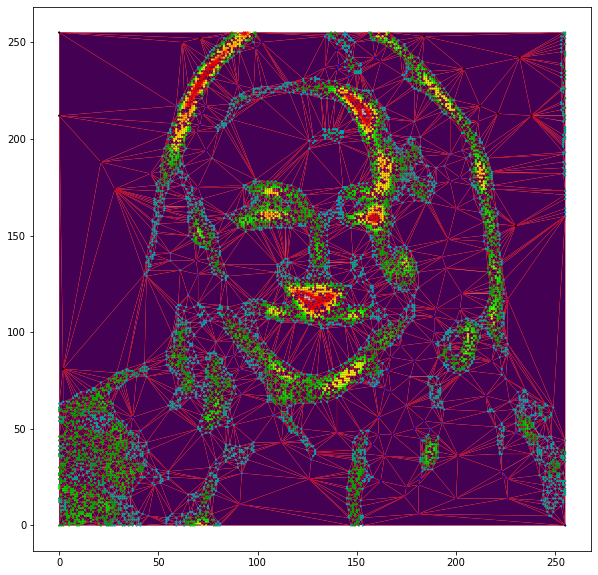

In [40]:

tri, _ = triangulate(sampled_grad_pixels)
pixel_vals = grad_blurred[255 - tri.points[:, 1].astype(np.int),  tri.points[:, 0].astype(np.int)]

plt.figure(figsize=(10, 10))
plt.tripcolor(tri.points[:, 0], tri.points[:, 1], tri.simplices, np.ones_like(pixel_vals), edgecolor="red")
plt.scatter(tri.points[:, 0], tri.points[:, 1], c=pixel_vals, cmap='nipy_spectral', s=1.5)

In [41]:
# export cld_mst

def to_graph(tri):
    nbrs = {i:set() for i in range(len(tri.points))}

    for smplx in tri.simplices:
        nbrs[smplx[0]].add(smplx[1])
        nbrs[smplx[1]].add(smplx[2])
        nbrs[smplx[2]].add(smplx[0])

        nbrs[smplx[1]].add(smplx[0])
        nbrs[smplx[2]].add(smplx[1])
        nbrs[smplx[0]].add(smplx[2])
    
    return nbrs

In [42]:
graph = to_graph(tri)
graph[896]

{853, 854, 855, 874, 895, 918, 936}

In [43]:
# export cld_mst

import heapq
from collections import defaultdict

def extract_path_rec(from_key, to_key, reverse_paths, out_list):
    next_key = reverse_paths[from_key]
    
    if next_key != to_key and next_key in reverse_paths:
        extract_path_rec(next_key, to_key, reverse_paths, out_list)
        
    out_list.append(next_key)
    return out_list

def extract_path(from_key, to_key, reverse_paths):
    path = extract_path_rec(from_key, to_key, reverse_paths, [])
    path.append(from_key)
    return path

def a_star(start_vertex, goal_vertex, graph, weight, heuristic, return_len=False):
    if start_vertex == goal_vertex:
        return [start_vertex, goal_vertex]
    q = [(0, start_vertex)]
    possible_nexts = set([start_vertex])
    reverse_paths = {}
    cheapest_paths = defaultdict(lambda: float('+inf'))
    cheapest_total = defaultdict(lambda: float('+inf'))
    cheapest_paths[start_vertex] = 0
    while len(possible_nexts) > 0:
        curr_f, curr = heapq.heappop(q)
        possible_nexts.remove(curr)
        if curr == goal_vertex:
            path = extract_path(goal_vertex, start_vertex, reverse_paths)
            if return_len:
                return path, cheapest_paths[goal_vertex]
            else:
                return path
        
        if curr not in graph:
            continue
        nbrs = graph[curr]
        
        for nbr in nbrs:
            h = weight(curr, nbr)
            maybe_best_g = h + cheapest_paths[curr]
            if cheapest_paths[nbr] > maybe_best_g:
                reverse_paths[nbr] = curr
                cheapest_paths[nbr] = maybe_best_g
                f = maybe_best_g + heuristic(nbr, goal_vertex)
                if nbr not in possible_nexts:
                    possible_nexts.add(nbr)
                    heapq.heappush(q, (f, nbr))

In [44]:
# export cld_mst

import time
from math import sqrt 

def merge_naive(lines):
    all_coords = [list(line.coords) for line in lines]
    flattened = [coord for coords in all_coords for coord in coords]
    return geom.LineString(flattened)

def pt_vert_distance(pt, tri, idx):
    return sqrt(tuple_sq_dist(pt, tri.points[idx]))

def nearest_line(pt, lines, remaining_line_idxs):
    nearest = None
    nearest_idx = None
    flip = False
    closest_dist = 1e10
    for idx in remaining_line_idxs:
        other = lines[idx]
        start_dist = tuple_sq_dist(pt, other.coords[0])
        end_dist = tuple_sq_dist(pt, other.coords[-1])
        if start_dist < closest_dist:
            flip = False
            closest_dist = start_dist
            nearest = other
            nearest_idx = idx
        elif end_dist < closest_dist:
            flip = True
            closest_dist = end_dist
            nearest = other
            nearest_idx = idx
    return nearest, nearest_idx, flip


def mk_heuristic_fn(tri, grad_blurred):
    
    grad_max = grad_blurred.max()

    def distance(i, j):
        i_pos = tri.points[i]
        j_pos = tri.points[j]
        dx = i_pos - j_pos
        return np.linalg.norm(dx)

    def heuristic(i, goal):
        dist = distance(i, goal)
        coords = tri.points[i].astype(np.int)
        edginess = grad_blurred[255 - coords[1], coords[0]]
        return dist + (1.0 - edginess) * 10
    return heuristic

def mk_weight_fn(tri, grad_blurred):
    def distance(i, j):
        i_pos = tri.points[i]
        j_pos = tri.points[j]
        dx = i_pos - j_pos
        return np.linalg.norm(dx)

    grad_max = grad_blurred.max()

    def weight(i, j):
        dist = distance(i, j) ** 1.5
        i_pos = tri.points[i]
        j_pos = tri.points[j]

        mid = (i_pos + j_pos).astype(np.int) // 2
        i_pos = i_pos.astype(np.int)
        j_pos = j_pos.astype(np.int)
        edginess = (grad_blurred[255 - mid[1], mid[0]] +
                    grad_blurred[255 - i_pos[1], i_pos[0]] + 
                    grad_blurred[255 - j_pos[1], j_pos[0]])/3.0
        return dist + (1.0 - edginess)*10
    return weight

def tuple_sq_dist(a, b):
    dx = a[0] - b[0]
    dy = a[1] - b[1]
    return (dx*dx) + (dy*dy)
    
    
def insert_a_star_connections(lines, tri, graph_copy, grad_blurred):
    weight = mk_weight_fn(tri, grad_blurred)
    heuristic = mk_heuristic_fn(tri, grad_blurred)
    remaining_lines = set(range(len(lines)))
    curr_idx = 0
    out = [lines[curr_idx]]
    remaining_lines.remove(curr_idx)
    pts_added = []
    while len(remaining_lines) > 0:
        curr = lines[curr_idx]
        end_curr = curr.coords[-1]
        dist = float('+inf')
        nearest_tail, nearest_tail_idx, flip = nearest_line(end_curr, lines, remaining_lines)
        
        if flip:
            nearest_tail.coords = list(nearest_tail.coords)[::-1]

        remaining_lines.remove(nearest_tail_idx)
        
        next_start_x, next_start_y = nearest_tail.coords[0]
        goal_pos = next_start_x, next_start_y
        
        goal_smplx_idx = tri.find_simplex(goal_pos)
        goal_smplx = tri.simplices[goal_smplx_idx]
        nearest_smplx_corner_to_goal = min(goal_smplx, key=lambda idx: pt_vert_distance(goal_pos, tri, idx))
        
        curr_smplx_idx = tri.find_simplex(end_curr)
        curr_smplx = tri.simplices[curr_smplx_idx]
        nearest_smplx_corner_to_curr = min(curr_smplx, key=lambda idx: pt_vert_distance(end_curr, tri, idx))
        
        if (nearest_smplx_corner_to_goal != nearest_smplx_corner_to_curr
            and nearest_smplx_corner_to_goal in graph_copy
            and nearest_smplx_corner_to_curr in graph_copy):
            path_between = a_star(nearest_smplx_corner_to_curr, nearest_smplx_corner_to_goal, graph_copy, weight, heuristic)
            
            if path_between is not None:
                for i in range(len(path_between) - 1):
                    p_i = path_between[i]
                    p_next = path_between[i + 1]
                    graph_copy[p_i].remove(p_next)
                    #del graph_copy[p_i]
                    #print('del', p_i)

                pts_between = [tuple(tri.points[idx]) for idx in path_between]
                pts_added.append(geom.LineString(pts_between))
                out.append(geom.LineString(pts_between))
            else:
                print("no path")
        out.append(nearest_tail)
        curr_idx = nearest_tail_idx
    return out, pts_added


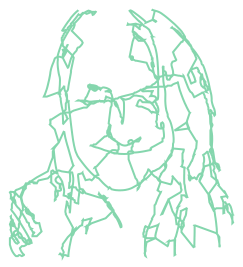

In [45]:
#profile:
# %lprun -u 0.001 -f nearest_line insert_a_star_connections(reorder_start_dist(center_geom_lines), tri, graph)
# %lprun -u 0.001 -f a_star insert_a_star_connections(reorder_start_dist(center_geom_lines), tri, graph)
# %lprun -u 0.001 -f insert_a_star_connections insert_a_star_connections(reorder_start_dist(center_geom_lines), tri, graph)

graph = to_graph(tri)
a_star_connected, added_pts = insert_a_star_connections((center_geom_lines), tri, graph, grad_blurred)
merged = merge_naive(a_star_connected)
merged

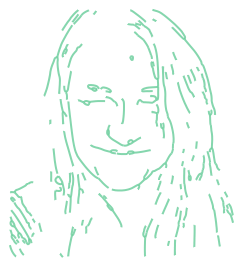

In [46]:
geom.GeometryCollection(center_geom_lines)

In [47]:
geom.GeometryCollection([l.buffer(l.coords[0][1] * 0.01) for l in center_geom_lines])

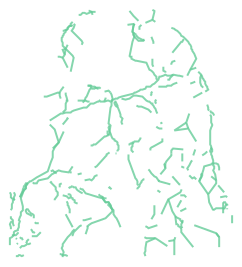

In [48]:
geom.GeometryCollection(added_pts)

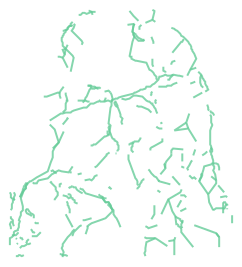

In [49]:
geom.GeometryCollection(added_pts)

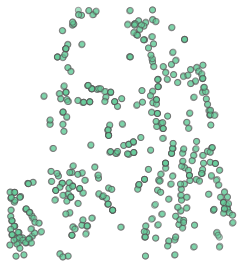

In [50]:
geom.GeometryCollection([geom.Point(line.coords[0]) for line in a_star_connected] + 
                        [geom.Point(line.coords[-1]) for line in a_star_connected])

In [51]:
import descartes as des

ModuleNotFoundError: No module named 'descartes'

In [ ]:
starts = np.asarray([line.coords[0] for line in a_star_connected])
ends = np.asarray([line.coords[-1] for line in a_star_connected])
length = np.asarray([line.length for line in a_star_connected])

long_starts = starts[length > 40]
long_ends = ends[length > 40]

plt.figure(figsize=(10, 10))
plt.scatter(starts[:, 0], starts[:, 1], c='gray')
plt.scatter(ends[:, 0], ends[:, 1], c='gray')
plt.scatter(long_starts[:, 0], long_starts[:, 1], c='green')
plt.scatter(long_ends[:, 0], long_ends[:, 1], c='red')

for start, end in zip(long_starts, long_ends):
    plt.plot([start[0], end[0]], [start[1], end[1]])

In [52]:
plt.hist(length, bins=30)

NameError: name 'length' is not defined

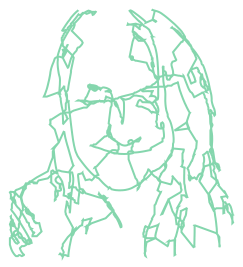

In [53]:
merged

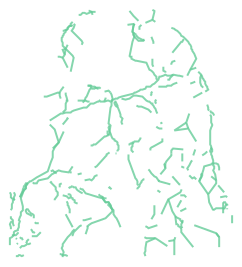

In [54]:
geom.GeometryCollection(added_pts)

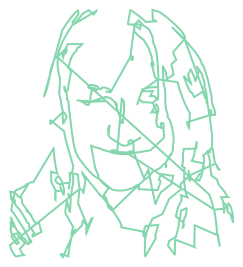

In [55]:

merge_naive(greedy_reorder(reorder_center_dist(center_geom_lines)))

1. make few canny edges
2. solve for path
3. pick connectors from dense edges

aka

1. make lots of canny edges
2. solve for path by picking points in between ends and snapping them to nearest lines

or

1. make edges
2. a* w/ heuristics based on edgi-ness of pixel along delauncy triangulion of face or polar grid

+

1. centerline optimization

In [56]:
# export cld_mst

def pipeline(gray):
    
    edges = raster_edges(gray)
    edges[:, 240:] = 255
    edges[:, :16] = 255
    edges[:4, :] = 255
    edges[252:, :] = 255
    
    cv2.imwrite('trace_in.bmp', edges)
    if os.name == 'nt':
        subprocess.check_call(r'.\potrace-1.16.win64\potrace.exe trace_in.bmp -o trace_out.geojson -b geojson')
    else:
        subprocess.check_call(r'./potrace-1.16.linux-x86_64/potrace trace_in.bmp -o trace_out.geojson -b geojson', shell=True)
    
    with open('trace_out.geojson') as fp:
        geojson = json.load(fp)

    shapes = [geom.shape(feature["geometry"]) for feature in geojson['features']]
    
    center_geom_lines = extract_centerlines(shapes)

    center_geom_lines = explode_multilines(center_geom_lines)

    center_geom_lines = [line for line in center_geom_lines 
                         if max(line.length, geom.Point(line.coords[0]).distance(geom.Point(line.coords[-1]))) > 4]

    grad = sobel(gray)

    grad_blurred = cv2.GaussianBlur(grad / grad.max(), (9, 9), 5.0)

    grad_samples = sample_grad(grad_blurred)

    tri, grad_samples = triangulate(grad_samples)

    graph = to_graph(tri)
    
    a_star_connected, added_pts = insert_a_star_connections(reorder_start_dist(center_geom_lines), tri, graph, grad_blurred)
    merged = merge_naive(a_star_connected)
    return merged

def rgb2line(img):
    rgb = np.asarray(img)
    gray = cv2.cvtColor(rgb, cv2.COLOR_RGB2GRAY)
    line = pipeline(gray)
    return line.__geo_interface__
    


In [57]:
#%lprun -u 0.001 -f pipeline pipeline(examples[0])
 # %lprun -u 0.001 -f insert_a_star_connections pipeline(examples[0])

In [58]:
len(center_geom_lines)

230

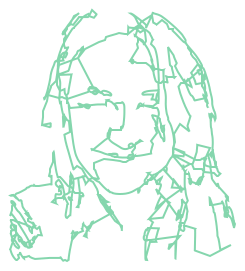

In [59]:
out = pipeline(examples[0])
out

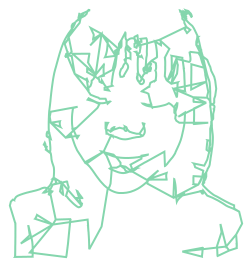

In [60]:
pipeline(examples[1])

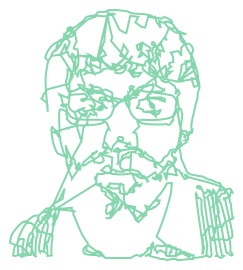

In [61]:
pipeline(examples[2])

In [62]:
import numpy as np
import scipy.interpolate as interpolate

def smooth(line, simplify=5.0, resample=10):

    x, y = line.simplify(simplify).coords.xy
    t = np.arange(len(x))
    ti = np.linspace(0, t.max(), resample * t.size)

    xi = interpolate.interp1d(t, x, kind='cubic')(ti)
    yi = interpolate.interp1d(t, y, kind='cubic')(ti)

    return geom.asLineString(np.dstack((xi, yi)).squeeze())

@interact(simplify=(0.0, 30.0), resample=(1, 10))
def _test(simplify, resample):
    return smooth(out, simplify, resample)

interactive(children=(FloatSlider(value=15.0, description='simplify', max=30.0), IntSlider(value=5, descriptio…

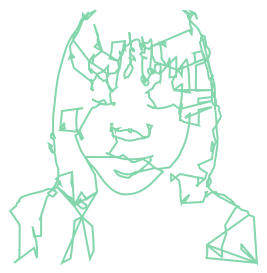

In [63]:
pipeline(examples[1])

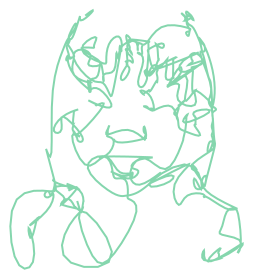

In [64]:
smooth(pipeline(examples[1]), 4.0, 4)

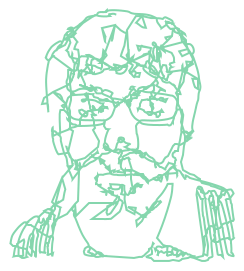

In [65]:
pipeline(examples[2])

In [66]:
beardglasses = pipeline(examples[2])


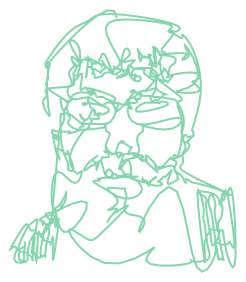

In [67]:
smooth(beardglasses, 50.0, 4)

# next steps
1. make server
2. dense canny
3. splat on dlib face tracker
3. figure out consistent edge parameters
    1. histogram eq, hp filter
    2. take ROI from face, try M taus, find one that has some constant number of variance/num edges
    3. diff cld params for diff regions of face (e.g low tau in center, high tau outside)
4. see smoothed vector edges after astar
5. figure out flow field of edges, align lines with neighbours
6. try just connecting endpoints w/ ok to go over lines already one then solve path on top of that
7. ? order lines by epicycles / curvature ?
    1. fit a limited number of bezier/circle arc to line, compute err
8. Just throw in all the edges from the triangulation and original image and find the MST but you also don't wanna visit the triangulation verticies
    1. approx astar cost in mst computation

In [69]:
gray = examples[0]    
edges = raster_edges(gray)
edges[:, 240:] = 255
edges[:, :16] = 255
edges[240:, :] = 255
edges[:16, :] = 255
cv2.imwrite('trace_in.bmp', edges)
if os.name == 'nt':
    subprocess.check_call(r'.\potrace-1.16.win64\potrace.exe trace_in.bmp -o trace_out.geojson -b geojson')
else:
    subprocess.check_call(r'./potrace-1.16.linux-x86_64/potrace trace_in.bmp -o trace_out.geojson -b geojson', shell=True)

with open('trace_out.geojson') as fp:
    geojson = json.load(fp)

shapes = [geom.shape(feature["geometry"]) for feature in geojson['features']]

center_geom_lines = extract_centerlines(shapes)

center_geom_lines = explode_multilines(center_geom_lines)

center_geom_lines = [line for line in center_geom_lines 
                     if max(line.length, geom.Point(line.coords[0]).distance(geom.Point(line.coords[-1]))) > 4]


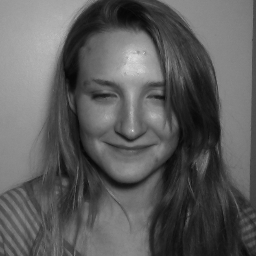

In [70]:
show(gray)

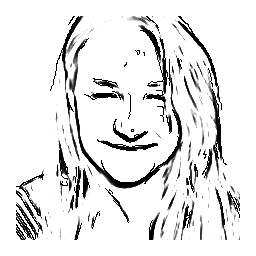

In [71]:
show(edges)

In [84]:
from math import floor

grad = sobel(gray)

grad_blurred = cv2.GaussianBlur(grad / grad.max(), (9, 9), 5.0)

grad_samples = sample_grad(grad_blurred)

for line in center_geom_lines:
    s = line.coords[0]
    e = line.coords[-1]
    grad_samples[floor(s[0]), floor(s[1])] = 1
    grad_samples[floor(e[0]), floor(e[1])] = 1

tri, grad_samples = triangulate(grad_samples)

tri_graph = to_graph(tri)

weight = mk_weight_fn(tri, grad_blurred)
heuristic = mk_heuristic_fn(tri, grad_blurred)

center_geom_lines = reorder_start_dist(center_geom_lines)

In [85]:
def pipeline_steiner(gray):
    gray = examples[0]    
    edges = raster_edges(gray)
    edges[:, 240:] = 255
    edges[:, :16] = 255
    edges[240:, :] = 255
    edges[:16, :] = 255
    cv2.imwrite('trace_in.bmp', edges)
    if os.name == 'nt':
        subprocess.check_call(r'.\potrace-1.16.win64\potrace.exe trace_in.bmp -o trace_out.geojson -b geojson')
    else:
        subprocess.check_call(r'./potrace-1.16.linux-x86_64/potrace trace_in.bmp -o trace_out.geojson -b geojson', shell=True)

    with open('trace_out.geojson') as fp:
        geojson = json.load(fp)

    shapes = [geom.shape(feature["geometry"]) for feature in geojson['features']]

    center_geom_lines = extract_centerlines(shapes)

    center_geom_lines = explode_multilines(center_geom_lines)

    center_geom_lines = [line for line in center_geom_lines 
                         if max(line.length, geom.Point(line.coords[0]).distance(geom.Point(line.coords[-1]))) > 4]

    grad = sobel(gray)

    grad_blurred = cv2.GaussianBlur(grad / grad.max(), (9, 9), 5.0)

    grad_samples = sample_grad(grad_blurred)

    for line in center_geom_lines:
        s = line.coords[0]
        e = line.coords[-1]
        grad_samples[floor(s[0]), floor(s[1])] = 1
        grad_samples[floor(e[0]), floor(e[1])] = 1

    tri, grad_samples = triangulate(grad_samples)

    tri_graph = to_graph(tri)

    weight = mk_weight_fn(tri, grad_blurred)
    heuristic = mk_heuristic_fn(tri, grad_blurred)

    center_geom_lines = reorder_start_dist(center_geom_lines)
    
    data = []
    ss = []
    ts = []

    def w(i, j):
        start = tri.points[i]
        end = tri.points[j]
        mid = np.floor((start + end) / 2).astype(np.int)
        gf = 1.0 - grad_blurred[255 - mid[1], mid[0]]
        dist = np.linalg.norm(start - end)
        return dist + gf * 10.0

    for s, nbrs in tri_graph.items():
        for t in nbrs:
            ss.append(s)
            ts.append(t)
            data.append(w(s, t))
    mat = scipy.sparse.coo_matrix((data, (ss, ts))).tocsc()

In [86]:
data = []
ss = []
ts = []

def w(i, j):
    start = tri.points[i]
    end = tri.points[j]
    mid = np.floor((start + end) / 2).astype(np.int)
    gf = 1.0 - grad_blurred[255 - mid[1], mid[0]]
    dist = np.linalg.norm(start - end)
    return dist + gf * 10.0

for s, nbrs in tri_graph.items():
    for t in nbrs:
        ss.append(s)
        ts.append(t)
        data.append(w(s, t))
mat = scipy.sparse.coo_matrix((data, (ss, ts))).tocsc()

In [87]:
distances, preds = scipy.sparse.csgraph.dijkstra(mat, return_predecessors=True)

In [88]:
def extract_path_preds(preds, i, j):
    path = [j]
    k = j
    while preds[i, k] != -9999:
        path.append(preds[i, k])
        k = preds[i, k]
    return path[::-1]

In [89]:
# export cld_mst

def nearest_vertex(tri, pt):
    curr_smplx_idx = tri.find_simplex(pt)
    curr_smplx = tri.simplices[curr_smplx_idx]
    nearest_smplx_corner_to_curr = min(curr_smplx, key=lambda idx: pt_vert_distance(pt, tri, idx))            
    return nearest_smplx_corner_to_curr

In [90]:
shortest_paths = {}
graph = {}

tri_verts = [(nearest_vertex(tri, line.coords[0]), nearest_vertex(tri, line.coords[-1])) for line in center_geom_lines]
remaining_idxes = set(range(len(tri_verts)))

starts = np.asarray([v[0] for v in tri_verts])
ends = np.asarray([v[1] for v in tri_verts])

lines = []

curr = 0

added_lines = []

for curr in range(len(tri_verts)):
    
    start_idx, end_idx = tri_verts[curr]
    
    # both in same simplex
    if start_idx == end_idx:
        lines.append(center_geom_lines[curr])
        continue
    
    
    closest_dist = float("+inf")
    closest_tri_idx = None
    closest_idx = None
    for i, other_start in enumerate(starts):
        if i == curr:
            continue
        if distances[end_idx, other_start] < closest_dist:
            closest_dist = distances[end_idx, other_start]
            closest_tri_idx = other_start
            closest_idx = i
    
    lines.append(center_geom_lines[curr])
    
    path_verts = extract_path_preds(preds, end_idx, closest_tri_idx)
    
    if len(path_verts) > 1:
        as_pts = [center_geom_lines[curr].coords[-1]] + [tri.points[i] for i in path_verts] \
            + [center_geom_lines[closest_idx].coords[0]]
        
        # as_pts = [tri.points[i] for i in path_verts]
        
        lines.append(geom.LineString(np.asarray(as_pts)))
        
        #lines.append(geom.LineString(np.asarray(as_pts)).buffer(closest_dist))
        added_lines.append(geom.LineString(np.asarray(as_pts)))


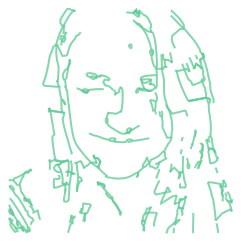

In [91]:
geom.GeometryCollection(lines)

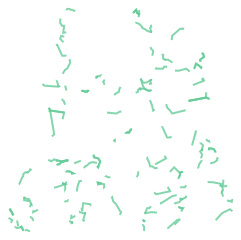

In [92]:
geom.GeometryCollection(added_lines)

In [93]:
len(center_geom_lines)

221

In [94]:
shortest_paths = {}

tri_verts = [(nearest_vertex(tri, line.coords[0]), 
              nearest_vertex(tri, line.coords[-1])) for line in center_geom_lines]
remaining_idxes = set(range(len(tri_verts)))

starts = np.asarray([v[0] for v in tri_verts])
ends = np.asarray([v[1] for v in tri_verts])

lines = []

curr = 0

added_lines = []

graph = {}

for curr in range(len(tri_verts)):
    
    start_idx, end_idx = tri_verts[curr]
        
    for i, other_start in enumerate(starts):
        graph[curr, i] = distances[end_idx, other_start]
        shortest_paths[curr, i] = extract_path_preds(preds, end_idx, other_start)


In [95]:
graph_is = []
graph_js = []
graph_weights = []

for (i, j), w in graph.items():
    graph_is.append(i)
    graph_js.append(j)
    graph_weights.append(w + 0.001) # hack to deal w/ 0 being interpreted as a hole in csgraph

graph_is = np.asarray(graph_is)
graph_js = np.asarray(graph_js)
graph_weights = np.asarray(graph_weights)

In [96]:
over_mat = scipy.sparse.coo_matrix((graph_weights, (graph_is, graph_js))).tocsc()
mst = scipy.sparse.csgraph.minimum_spanning_tree(over_mat)

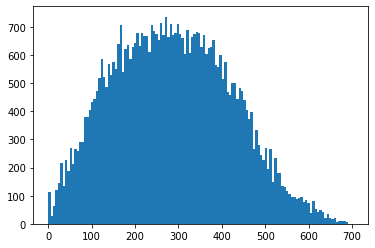

In [97]:
plt.hist(over_mat.data, bins=128);

In [98]:
from ortools.constraint_solver import routing_enums_pb2
from ortools.constraint_solver import pywrapcp

def print_solution(geoms, shortest_paths, tri, manager, routing, assignment):
    """Prints assignment on console."""
    print('Objective: {}'.format(assignment.ObjectiveValue()))
    index = routing.Start(0)
    plan_output = 'Route:\n'
    lines = []
    route_distance = 0
    while not routing.IsEnd(index):
        previous_index = index
        prev_idx = manager.IndexToNode(previous_index)
        plan_output += ' {} ->'.format(prev_idx)
        index = assignment.Value(routing.NextVar(index))
        idx = manager.IndexToNode(index)
        route_distance += routing.GetArcCostForVehicle(previous_index, index, 0)
        connector_verts = shortest_paths[prev_idx, idx]
        as_pts = [geoms[prev_idx].coords[-1]] + [tri.points[i] for i in connector_verts] \
            + [geoms[idx].coords[0]]
        lines.append(geoms[prev_idx])
        lines.append(geom.LineString(as_pts))
        
    plan_output += ' {}\n'.format(manager.IndexToNode(index))
    #print(plan_output)
    plan_output += 'Objective: {}m\n'.format(route_distance)
    return lines

def to_ortool_problem(mat, geoms, shortest_paths, tri):
    """Stores the data for the problem."""
    data = {}
    data['distance_matrix'] = mat.floor().todense().tolist()  # yapf: disable
    data['num_vehicles'] = 1
    data['depot'] = 0
    for i in range(len(data['distance_matrix'])):
        data['distance_matrix'][i][data['depot']] = 0
    
    manager = pywrapcp.RoutingIndexManager(mat.shape[0],
                                           data['num_vehicles'], data['depot'])

    # Create Routing Model.
    routing = pywrapcp.RoutingModel(manager)

    def distance_callback(from_index, to_index):
        """Returns the distance between the two nodes."""
        # Convert from routing variable Index to distance matrix NodeIndex.
        from_node = manager.IndexToNode(from_index)
        to_node = manager.IndexToNode(to_index)
        return data['distance_matrix'][from_node][to_node]

    transit_callback_index = routing.RegisterTransitCallback(distance_callback)
    routing.SetArcCostEvaluatorOfAllVehicles(transit_callback_index)

    search_parameters = pywrapcp.DefaultRoutingSearchParameters()
    search_parameters.first_solution_strategy = (
        routing_enums_pb2.FirstSolutionStrategy.AUTOMATIC)
    search_parameters.local_search_metaheuristic = (
        routing_enums_pb2.LocalSearchMetaheuristic.AUTOMATIC)
    search_parameters.time_limit.seconds = 30

    # Solve the problem.
    assignment = routing.SolveWithParameters(search_parameters)

    # Print solution on console.
    if assignment:
        return print_solution(geoms, shortest_paths, tri, manager, routing, assignment)

    return None


In [99]:
result = to_ortool_problem(over_mat, center_geom_lines, shortest_paths, tri)

Objective: 6541


In [100]:
gc = geom.GeometryCollection(result)
gc._repr_svg_()

'<svg xmlns="http://www.w3.org/2000/svg" xmlns:xlink="http://www.w3.org/1999/xlink" width="242.56" height="250.56" viewBox="6.720000000000001 -0.27999999999999936 242.56 250.56" preserveAspectRatio="xMinYMin meet"><g transform="matrix(1,0,0,-1,0,250.0)"><g><polyline fill="none" stroke="#66cc99" stroke-width="2.0" points="116.89333402498711,109.78908385598473 116.96195686750248,109.88183668478028 117.0696423844245,110.04625176697945 117.52834795786566,110.58283004503794 118.05036802294555,111.01073914938475 118.56268388953593,111.24456428394235 118.994856684604,111.2787358946456 119.0652702957455,111.31430479646232 119.56443014797068,111.34810033474994 119.64919373744313,111.31488394194237 120.06503721723597,111.34372732929683 120.16876007278637,111.30099323783648 120.56507017479422,111.32959442482354 120.66876007278637,111.28571292705277 121.0374922960334,111.31341967464277 121.16876007278637,111.25492844968636 121.53434850911128,111.28545612089528 121.7318995211899,111.19211127161498 

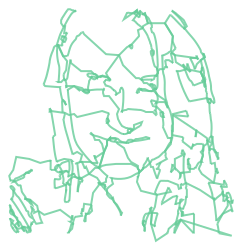

In [101]:

geom.GeometryCollection(result)

In [102]:
# export cld_mst

import pcst_fast

def image_to_lines(gray):
    
    edges = raster_edges(gray)
    edges[:, 240:] = 255
    edges[:, :16] = 255
    edges[240:, :] = 255
    edges[:16, :] = 255
    cv2.imwrite('trace_in.bmp', edges)
    if os.name == 'nt':
        subprocess.check_call(r'.\potrace-1.16.win64\potrace.exe trace_in.bmp -o trace_out.geojson -b geojson')
    else:
        subprocess.check_call(r'./potrace-1.16.linux-x86_64/potrace trace_in.bmp -o trace_out.geojson -b geojson', shell=True)

    with open('trace_out.geojson') as fp:
        geojson = json.load(fp)

    shapes = [geom.shape(feature["geometry"]) for feature in geojson['features']]

    center_geom_lines = extract_centerlines(shapes)

    center_geom_lines = explode_multilines(center_geom_lines)

    center_geom_lines = [line for line in center_geom_lines 
                         if max(line.length, geom.Point(line.coords[0]).distance(geom.Point(line.coords[-1]))) > 4]

    return center_geom_lines



In [103]:
sum(l.length for l in center_geom_lines)

2488.6059634841463

In [104]:
def extract_mst(mst,  geoms, tri, tri_preds, tri_dists, starts, ends, lines, added_lines):
    s, e = mst.nonzero()
    seen = set()
    lines = [geoms[i] for i in set(s) | set(e)]
    added_lines = []
    for start_idx, end_idx in zip(s, e):
        connector_start, connector_end = ends[start_idx], starts[end_idx]
        
        connector_verts = extract_path_preds(tri_preds, connector_start, connector_end)
        as_pts = [geoms[start_idx].coords[-1]] + [tri.points[i] for i in connector_verts] \
            + [geoms[end_idx].coords[0]]
        added_lines.append(geom.LineString(as_pts))
    
    return lines, added_lines

In [105]:
def _dfs_into(g, i, remaining, path):
    remaining[0] -= 1
    _, nbrs = g[i].nonzero()
    for nbr in nbrs:
        path.append((i, nbr, False))
        dfs(g, nbr, remaining, path)
        if remaining[0] > 0:
            path.append((nbr, i, True)) 


def extract_mst_dfs(mst, geoms, tri, tri_preds, tri_dists, starts, ends, lines, added_lines):
    broken
    s, e = mst.nonzero()
    first = s[0]
    remaining = [np.unique(s).size]
    path = []
    _dfs_into(mst, first, remaining, path)
    lines = []
    for start_idx, end_idx, flip in path:
        if flip:
            coords = list(geoms[start_idx].coords)
        else:
            lines.append(geoms[start_idx])
        connector_start, connector_end = ends[start_idx], starts[end_idx]
        connector_verts = extract_path_preds(tri_preds, connector_start, connector_end)
        as_pts = [geoms[start_idx].coords[-1]] + [tri.points[i] for i in connector_verts] \
            + [geoms[end_idx].coords[0]]
        added_lines.append(geom.LineString(as_pts))
    
    return lines, added_lines

In [106]:
# vertices, edges = pcst_fast(edges, prizes, costs, root, num_clusters, pruning, verbosity_level)
tri_mat = mat.copy()
tri_mat[starts, ends] = 0.00001234 #     
tri_mat[ends, starts] = 0.00001234 #     
flat_edges_i, flat_edges_j = tri_mat.nonzero()
flat_edges = np.dstack((flat_edges_i, flat_edges_j)).squeeze().astype(np.int64)
prizes = np.zeros(shape=(tri_mat.shape[0],), dtype=np.float64)
prizes[starts] = 100
prizes[ends] = 100
costs = np.asarray(tri_mat[flat_edges_i, flat_edges_j].squeeze()).squeeze()
flat_edges.shape, prizes.shape

/home/aman/miniconda3/envs/contour/lib/python3.6/site-packages/ipykernel_launcher.py:3: SparseEfficiencyWarning: Changing the sparsity structure of a csc_matrix is expensive. lil_matrix is more efficient.
  This is separate from the ipykernel package so we can avoid doing imports until
/home/aman/miniconda3/envs/contour/lib/python3.6/site-packages/ipykernel_launcher.py:4: SparseEfficiencyWarning: Changing the sparsity structure of a csc_matrix is expensive. lil_matrix is more efficient.
  after removing the cwd from sys.path.


((23818, 2), (3938,))

In [107]:
flat_edges.dtype, prizes.dtype, costs.shape

(dtype('int64'), dtype('float64'), (23818,))

In [164]:
v, steiner_edges = pcst_fast.pcst_fast(flat_edges, prizes, costs, -1, 1, 'gw', 1)

Finished GW clustering: final event time 3.280967e+01, number of edge events 42601



In [165]:
from collections import defaultdict

path = []

lines = center_geom_lines[:]
graph = defaultdict(list)

for edge_idx in steiner_edges:
    st, end = flat_edges[edge_idx]
    graph[st].append(end)
    graph[end].append(st)
    

# starts is original line index -> closest triangulation vertex

special_lines = {}
for i, (s, e) in enumerate(zip(starts, ends)):
    special_lines[(s, e)] = i, False
    special_lines[(e, s)] = i, True


In [272]:
# export cld_mst

def traverse(graph, curr, seen, tri, special, lines):
    seen.add(curr)
    nbrs = graph[curr]
    yield tri.points[curr]
    for nbr in nbrs:
        if nbr in seen:
            continue 
        
        if (curr, nbr) in special:
            line_idx, reverse = special[(curr, nbr)]
            yield from lines[line_idx].coords[::-1 if reverse else 1]
            
        yield from traverse(graph, nbr, seen, tri, special, lines)
        
        if len(seen) < len(graph):
            if (curr, nbr) in special:
                line_idx, reverse = special[(curr, nbr)]
                yield from lines[line_idx].coords[::1 if reverse else -1]

    if len(seen) < len(graph):
        yield tri.points[curr]


7258.361944908452


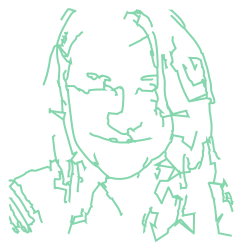

In [273]:
start_idx, start_line = max(enumerate(lines), key=lambda il: il[1].length)
res = geom.LineString([*traverse(graph, starts[0], set(), tri, special, lines)])
print(res.length)
res

In [306]:
# export cld_mst
# export cld_mst

class LineTooShort(Exception):
    pass

def traverse_nested(graph, curr, seen, tri, special, lines, min_len=50):
    seen.add(curr)
    nbrs = graph[curr]
    child_pts = []
        
    for nbr in nbrs:
        cur_len = 0
        if nbr in seen:
            continue 
            
        extend_with = []

        try:
            if (curr, nbr) in special:
                line_idx, reverse = special[(curr, nbr)]
                extend_with.extend(lines[line_idx].coords[::-1 if reverse else 1])

            extend_with.extend(traverse_nested(graph, nbr, seen, tri, special, lines, min_len))
            
            if len(seen) < len(graph):
                if (curr, nbr) in special:
                    cur_len += lines[line_idx].length
                    line_idx, reverse = special[(curr, nbr)]
                    extend_with.extend(lines[line_idx].coords[::1 if reverse else -1])
            
            if geom.LineString(extend_with).length > min_len:
                child_pts.extend(extend_with)
        except LineTooShort as e:
            pass
                
    
    yield tri.points[curr]
    yield from iter(child_pts)
    if len(seen) < len(graph):
        yield tri.points[curr]

6387.228800858259


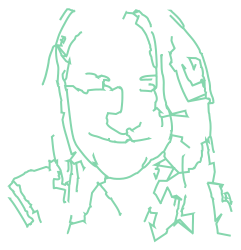

In [311]:
start_idx, start_line = max(enumerate(lines), key=lambda il: il[1].length)
res = geom.LineString([*traverse_nested(graph, starts[0], set(), tri, special, lines, 20)])
print(res.length)
res

In [253]:
# export cld_mst 

def rgb2line_steiner(img):
    rgb = np.asarray(img)
    gray = cv2.cvtColor(rgb, cv2.COLOR_RGB2GRAY)
    line = pipeline_steiner(gray)
    return line.__geo_interface__

def pipeline_steiner(gray):
    
    center_geom_lines = image_to_lines(gray)
    
    grad = sobel(gray)

    grad_blurred = cv2.GaussianBlur(grad / grad.max(), (9, 9), 5.0)

    grad_samples = sample_grad(grad_blurred)

    for line in center_geom_lines:
        s = line.coords[0]
        e = line.coords[-1]
        grad_samples[floor(s[0]), floor(s[1])] = 1
        grad_samples[floor(e[0]), floor(e[1])] = 1

    tri, grad_samples = triangulate(grad_samples)

    tri_graph = to_graph(tri)

    center_geom_lines = reorder_start_dist(center_geom_lines)
    
    data = []
    ss = []
    ts = []

    def w(i, j):
        start = tri.points[i]
        end = tri.points[j]
        mid = np.floor((start + end) / 2).astype(np.int)
        gf = 1.0 - grad_blurred[255 - mid[1], mid[0]]
        dist = np.linalg.norm(start - end)
        return dist + gf * 10.0

    for s, nbrs in tri_graph.items():
        for t in nbrs:
            ss.append(s)
            ts.append(t)
            data.append(w(s, t))
            
    mat = scipy.sparse.coo_matrix((data, (ss, ts))).tocsc()
    
    tri_verts = [(nearest_vertex(tri, line.coords[0]), nearest_vertex(tri, line.coords[-1])) for line in center_geom_lines]

    starts = np.asarray([v[0] for v in tri_verts])
    ends = np.asarray([v[1] for v in tri_verts])

    tri_mat = mat.copy()
    tri_mat[starts, ends] = 0.00001234 #     
    tri_mat[ends, starts] = 0.00001234 #     
    flat_edges_i, flat_edges_j = tri_mat.nonzero()
    flat_edges = np.dstack((flat_edges_i, flat_edges_j)).squeeze().astype(np.int64)
    prizes = np.zeros(shape=(tri_mat.shape[0],), dtype=np.float64)
    prizes[starts] = 100
    prizes[ends] = 100
    costs = np.asarray(tri_mat[flat_edges_i, flat_edges_j].squeeze()).squeeze()
    flat_edges.shape, prizes.shape
    
    v, es = pcst_fast.pcst_fast(flat_edges, prizes, costs, -1, 1, 'gw', 1)
    
    lines = center_geom_lines[:]
    
    graph = defaultdict(list)
    for e in es:
        st, end = flat_edges[e]
        graph[st].append(end)
        graph[end].append(st)


    special = {}
    for i, (s, e) in enumerate(zip(starts, ends)):
        special[(s, e)] = i, False
        special[(e, s)] = i, True

    return geom.LineString(traverse(graph, starts[0], set(), tri, special, lines))

Finished GW clustering: final event time 2.450510e+01, number of edge events 30547



/home/aman/miniconda3/envs/contour/lib/python3.6/site-packages/ipykernel_launcher.py:57: SparseEfficiencyWarning: Changing the sparsity structure of a csc_matrix is expensive. lil_matrix is more efficient.
/home/aman/miniconda3/envs/contour/lib/python3.6/site-packages/ipykernel_launcher.py:58: SparseEfficiencyWarning: Changing the sparsity structure of a csc_matrix is expensive. lil_matrix is more efficient.


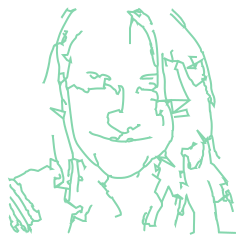

In [256]:
res0 = pipeline_steiner(examples[0])
res0

Finished GW clustering: final event time 2.610411e+01, number of edge events 13911



/home/aman/miniconda3/envs/contour/lib/python3.6/site-packages/ipykernel_launcher.py:57: SparseEfficiencyWarning: Changing the sparsity structure of a csc_matrix is expensive. lil_matrix is more efficient.
/home/aman/miniconda3/envs/contour/lib/python3.6/site-packages/ipykernel_launcher.py:58: SparseEfficiencyWarning: Changing the sparsity structure of a csc_matrix is expensive. lil_matrix is more efficient.


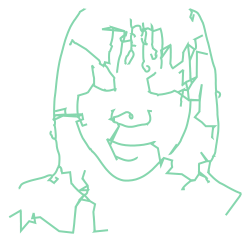

In [257]:
res1 = pipeline_steiner(examples[1])
res1

Finished GW clustering: final event time 1.443966e+01, number of edge events 23531



/home/aman/miniconda3/envs/contour/lib/python3.6/site-packages/ipykernel_launcher.py:57: SparseEfficiencyWarning: Changing the sparsity structure of a csc_matrix is expensive. lil_matrix is more efficient.
/home/aman/miniconda3/envs/contour/lib/python3.6/site-packages/ipykernel_launcher.py:58: SparseEfficiencyWarning: Changing the sparsity structure of a csc_matrix is expensive. lil_matrix is more efficient.


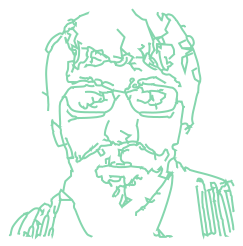

In [258]:
res2 = pipeline_steiner(examples[2])
res2

In [ ]:
only_steiner = []
for e in es:
    st, end = flat_edges[e]
    verts = [tri.points[st], tri.points[end]]
    only_steiner.append(geom.LineString(verts))

geom.GeometryCollection(only_steiner)

In [ ]:
lines, added_lines = extract_mst(mst, center_geom_lines, tri, preds, distances, starts, ends, lines, added_lines)
mst_connected = geom.GeometryCollection(lines + added_lines)
mst_connected

In [ ]:
print(f"""
ortools tsp length: {sum(l.length for l in result)}
mst bound length  : {sum(l.length for l in lines) * 2 + sum(l.length for l in added_lines) * 2}
""");

In [ ]:
from numba import njit

In [ ]:
def scan_pow2(fn, init, seq):
    ls = len(seq)
    if ls == 0:
        return [], init
    elif ls == 1:
        return [init], [seq[0]]
    else:
        seq_prime = [fn(seq[2*i], seq[2*i + 1]) for i in range(len(seq) // 2)]
        R, t = scan_pow2(fn, init, seq_prime)
        return [R[i // 2] if i % 2 == 0 else fn(R[i // 2], seq[i - 1]) for i in range(len(seq))], t

In [ ]:
scan_pow2(lambda x, y: x + y, 0, [1, 2, 3, 4])

In [ ]:
import textwrap

def export_svg(fname, geometry, dpi=100, margin=0):
    # from https://stackoverflow.com/a/49149957
    with open(fname, 'w') as f:
        #specify margin in coordinate units

        bbox = list(geometry.bounds)
        bbox[0] -= margin
        bbox[1] -= margin
        bbox[2] += margin
        bbox[3] += margin

        width = bbox[2] - bbox[0]
        height = bbox[3] - bbox[1]

        scale = 1.0/dpi
        
        props = {
            'version': '1.1',
            'baseProfile': 'full',
            'width': '{width:.0f}in'.format(width = width*scale),
            'height': '{height:.0f}in'.format(height = height*scale),
            'viewBox': '%.1f,%.1f,%.1f,%.1f' % (bbox[0], bbox[1], width, height),
            'xmlns': 'http://www.w3.org/2000/svg',
            'xmlns:ev': 'http://www.w3.org/2001/xml-events',
            'xmlns:xlink': 'http://www.w3.org/1999/xlink'
        }

        f.write(textwrap.dedent(r'''
            <?xml version="1.0" encoding="utf-8" ?>
            <svg {attrs:s}>
            {data:s}
            </svg>
        ''').format(
            attrs = ' '.join(['{key:s}="{val:s}"'.format(key = key, val = props[key]) for key in props]),
            data = geometry.svg()
        ).strip())

In [ ]:
export_svg('output.svg', geom.GeometryCollection(lines + added_lines), margin=100)

In [ ]:
export_svg()

In [ ]:
len_bound = sum(l.length for l in lines) * 2 + sum(l.length for l in added_lines) * 2
len_bound

In [ ]:
out.length

In [ ]:
geom.GeometryCollection(added_lines)

In [ ]:
import ortools

In [ ]:
lines = []
added_lines = []
for i, line_idx in enumerate(route):
    start, end = tri_verts[line_idx]
    lines.append(center_geom_lines[line_idx])
    if i == len(route) - 1:
        break
    
    next_idx = route[i + 1]
    next_start, next_end = tri_verts[next_idx]
    
    if next_end == start:
        continue
        
    path_verts = extract_path_preds(preds, end, next_start)
    as_pts = np.stack([tri.points[i] for i in path_verts])
    if len(as_pts) > 1:
        added_lines.append(geom.LineString(as_pts))

In [ ]:
geom.GeometryCollection(lines + added_lines)

In [ ]:
geom.GeometryCollection(added_lines)

In [ ]:
import numba

def intergrate_spring(xy, out, mass, k, damp):
    tail_delta = np.array([0, 0])
    tail_pos = xy[0] + tail_delta
    vec = np.array([0, 0])
    for i in range(xy.shape[0]):
        pos = xy[i]
        tail_delta = pos - tail_pos
        force = -k * tail_delta
        accel = force / mass
        vel += accel
        vel *= damp
        tail_pos += vel
        out[i] = tail_pos